# Import libraries

In [4]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium

from sklearn.ensemble import RandomForestClassifier
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

import joblib

import time
import os

# Import Data

In [32]:

#95_file='/content/v5_20230407_091351_95m.csv'
#310_file='/content/v5_20230408_082538_310m.csv'
file_206='/content/v5_20230409_090939_206m.csv'
#file_290='/content/v5_20240127_090226_290m.csv'
#file_135='/content/v5_20240203_091405_135m.csv'
#file_57='/content/v5_20240204_150730_57m.csv'
#file_166='/content/v5_20240204_094535_166m.csv'
#df_95=pd.read_csv(95_file)
#df_310=pd.read_csv(310_file)
df_206=pd.read_csv(file_206)
#df_290=pd.read_csv(file_290)
#df_135=pd.read_csv(file_135)
#df_57=pd.read_csv(file_57)
#df_166=pd.read_csv(file_166)



In [33]:
df_206

,Timestamp,accelX(g),accelY(g),accelZ(g),accelUserX(g),accelUserY(g),accelUserZ(g),gyroX(rad/s),gyroY(rad/s),gyroZ(rad/s),...,ActivityType,ActivityConfidence,Pressure(kilopascals),RelativeAltitude(meters),magX(µT),magY(µT),magZ(µT),calMagX(µT),calMagY(µT),calMagZ(µT)
0,09-Apr-2023 09:09:39.979,-0.0725,-0.9272,-0.7220,-0.0473,0.0011,-0.4685,-0.3570,0.0006,-0.3407,...,Stationary,Low,78.7129,1.9182,-116.1901,-95.9268,-76.0076,-4.0338,-40.8268,4.5567
1,09-Apr-2023 09:09:39.981,-0.0725,-0.9272,-0.7220,-0.0249,-0.0319,-0.2194,0.6848,-0.6088,-0.1956,...,Stationary,Low,78.7129,1.9182,-116.1901,-95.9268,-76.0076,-3.8767,-40.9227,4.6714
2,09-Apr-2023 09:09:39.981,-0.0725,-0.9272,-0.7220,-0.0249,-0.0319,-0.2194,0.6848,-0.6088,-0.1956,...,Stationary,Low,78.7129,1.9182,-115.9480,-95.7694,-75.5397,-3.8767,-40.9227,4.6714
3,09-Apr-2023 09:09:39.985,0.0197,-1.0018,-0.5080,-0.0239,-0.0306,-0.2227,0.6996,-0.8581,-0.0679,...,Stationary,Low,78.7129,1.9182,-115.9480,-95.7694,-75.5397,-3.8767,-40.9227,4.6714
4,09-Apr-2023 09:09:39.996,0.1890,-1.0938,-0.3944,0.1304,-0.1245,-0.0687,0.6565,-1.0381,0.1358,...,Stationary,Low,78.7129,1.9182,-115.9480,-95.7694,-75.5397,-3.6705,-40.9901,4.8982
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1232542,09-Apr-2023 12:35:52.580,0.2053,-0.4362,-0.7583,0.0147,-0.0285,0.1406,0.0272,0.2680,0.0528,...,Unknown,High,85.8520,-701.7922,-76.4675,-114.4828,-120.1253,-0.3278,-38.2571,-7.2546
1232543,09-Apr-2023 12:35:52.589,0.1908,-0.4307,-0.8224,-0.0045,-0.0233,0.0775,-0.1323,-0.0718,0.0130,...,Unknown,High,85.8520,-701.7922,-76.4675,-114.4828,-120.1253,-0.4215,-38.2335,-7.3032
1232544,09-Apr-2023 12:35:52.600,0.2315,-0.4145,-0.8721,0.0326,-0.0125,0.0268,-0.2479,-0.3634,-0.0012,...,Unknown,High,85.8520,-701.7922,-76.4675,-114.4828,-120.1253,-0.2180,-37.7966,-7.4397
1232545,09-Apr-2023 12:35:52.610,0.2623,-0.3946,-0.9105,0.0731,0.0089,-0.0107,-0.2583,-0.4049,0.0516,...,Unknown,High,85.8520,-701.7922,-76.4675,-114.4828,-120.1253,-0.4073,-37.8594,-7.6838


# Helper functions

In [34]:
def convert_datetime(df):

    # Convert 'Timestamp' column to datetime format
    df['Timestamp'] = pd.to_datetime(df['Timestamp'], unit='ns')

    return df

In [35]:
def plot_total_alt_over_time(df, plot_title='Total Tracked Altitude Over Time'):

    # Create the scatter plot using Plotly Express
    fig = px.scatter(df,
                     x=df['Timestamp'],
                     y=df['Alt(m)'])

    # Update the layout with title and axis labels
    fig.update_layout(
            title='Altitude over Time',
            xaxis_title='Timestamp',
            yaxis_title='Altitude (m)',
            coloraxis_colorbar=dict(title='Cluster Label'),
            width=1000,
            height=600
        )

    # Show the Plotly figure
    fig.show()

In [36]:
def plot_manual_labeling(df):
    # Plot for Altitude over Time, colored by 'on_lift' status
    plt.figure(figsize=(15, 10))

    # Plot points where 'on_lift' is 1 with one color
    plt.scatter(df.loc[df['on_lift'] == 1, 'Timestamp'],
                df.loc[df['on_lift'] == 1, 'Alt(m)'],
                c='red',
                label='On the lift',
                marker='o')

    # Plot points where 'on_lift' is 0 with another color
    plt.scatter(df.loc[df['on_lift'] == 0, 'Timestamp'],
                df.loc[df['on_lift'] == 0, 'Alt(m)'],
                c='blue',
                label='Not on the lift',
                marker='o')

    plt.title('Labeled Data')
    plt.xlabel('Timestamp')
    plt.ylabel('Altitude (m)')
    plt.legend()
    plt.show()

In [37]:
def map_lift_rides(df):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(),
                  df['Long'].mean()]
    mymap = folium.Map(location=map_center, zoom_start=10)

    # Plot data points with on_lift type
    on_lift = df[df['on_lift'] == 1]
    for index, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='red',
                            fill=True,
                            fill_color='red',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Plot data points with not_on_lift types
    not_on_lift = df[df['on_lift'] != 1]
    for index, row in not_on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                            radius=5,
                            color='blue',
                            fill=True,
                            fill_color='blue',
                            tooltip=str(row['Timestamp'])).add_to(mymap)

    # Return the map object
    return mymap


# Label data to prepare df for supervised learning

In [38]:
initial_shape=df_206.shape
print(f'Initial shape: {initial_shape}')

Initial shape: (1232547, 44)


##### Check for missing values and drop rows with missing values

In [39]:
# Count missing values in entire DataFrame
df_206.isnull().sum()

Timestamp                   0
accelX(g)                   0
accelY(g)                   0
accelZ(g)                   0
accelUserX(g)               0
accelUserY(g)               0
accelUserZ(g)               0
gyroX(rad/s)                0
gyroY(rad/s)                0
gyroZ(rad/s)                0
Roll(rads)                  0
Pitch(rads)                 1
Yaw(rads)                   0
m11                         0
m12                         0
m13                         0
m21                         0
m22                         0
m23                         0
m31                         0
m32                         0
m33                         0
qX                          0
qY                          0
qZ                          0
qW                          0
Lat                         0
Long                        0
Speed(m/s)                  0
TrueHeading                 0
Alt(m)                      0
HorizontalAccuracy(m)       0
VerticalAccuracy(m)         0
Course    

In [41]:
# Drop rows with any missing values
df_206.dropna(inplace=True)
print(f'Initial shape: {initial_shape}')
print(f'New shape: {df_206.shape}')

Initial shape: (1232547, 44)
New shape: (1232546, 44)


##### Convert to datetime

In [42]:
df_206=convert_datetime(df_206)

In [43]:
#Verify
df_206.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1232546 entries, 0 to 1232546
Data columns (total 44 columns):
 #   Column                    Non-Null Count    Dtype         
---  ------                    --------------    -----         
 0   Timestamp                 1232546 non-null  datetime64[ns]
 1   accelX(g)                 1232546 non-null  float64       
 2   accelY(g)                 1232546 non-null  float64       
 3   accelZ(g)                 1232546 non-null  float64       
 4   accelUserX(g)             1232546 non-null  float64       
 5   accelUserY(g)             1232546 non-null  float64       
 6   accelUserZ(g)             1232546 non-null  float64       
 7   gyroX(rad/s)              1232546 non-null  float64       
 8   gyroY(rad/s)              1232546 non-null  float64       
 9   gyroZ(rad/s)              1232546 non-null  float64       
 10  Roll(rads)                1232546 non-null  float64       
 11  Pitch(rads)               1232546 non-null  float6

In [44]:
def reduce_sampling_rate(df):
    df.set_index('Timestamp', inplace=True)
    # Set the 'Timestamp' column as the DataFrame's index
    df_resampled = df.resample('S').first()
    # Reset the index to create a standard numerical index
    df_resampled.reset_index(inplace=True)
    # option
    # export to CSV
    # df_resampled.to_csv('df_206_reduced_sample_rate.csv', index=False)
    return df_resampled

In [45]:
df_206=reduce_sampling_rate(df_206)

In [46]:
df_206.head()

,Timestamp,accelX(g),accelY(g),accelZ(g),accelUserX(g),accelUserY(g),accelUserZ(g),gyroX(rad/s),gyroY(rad/s),gyroZ(rad/s),...,ActivityType,ActivityConfidence,Pressure(kilopascals),RelativeAltitude(meters),magX(µT),magY(µT),magZ(µT),calMagX(µT),calMagY(µT),calMagZ(µT)
0,2023-04-09 09:09:39,-0.0725,-0.9272,-0.7220,-0.0473,0.0011,-0.4685,-0.3570,0.0006,-0.3407,...,Stationary,Low,78.7129,1.9182,-116.1901,-95.9268,-76.0076,-4.0338,-40.8268,4.5567
1,2023-04-09 09:09:40,0.2685,-1.1419,-0.3352,0.2776,-0.1910,0.0061,0.6376,-0.9903,0.3236,...,Stationary,Low,78.7129,1.9182,-115.9480,-95.7694,-75.5397,-3.6450,-41.1244,5.2107
2,2023-04-09 09:09:41,-0.1160,-0.8515,-0.5708,-0.0257,0.0061,-0.0485,-0.1042,0.0347,-0.0230,...,Unknown,High,78.7068,2.5420,-116.5621,-95.5421,-80.9511,-4.3155,-40.2013,-1.1107
3,2023-04-09 09:09:42,-0.1177,-0.8770,-0.4650,-0.0182,-0.0108,0.0350,-0.0410,0.0661,-0.0015,...,Unknown,High,78.7002,3.2183,-116.4982,-95.2317,-80.0228,-4.6972,-40.1297,0.1049
4,2023-04-09 09:09:43,-0.1802,-0.8674,-0.3573,-0.0461,0.0038,0.1109,-0.2186,0.3179,-0.0512,...,Unknown,High,78.6940,3.8552,-117.1008,-95.2255,-80.6023,-5.1725,-40.2576,-0.4379


###### Label data on_lift

In [47]:
# export to CSV
name_of_csv='df_206_reduce_sampling_rate.csv'
df_206.to_csv(name_of_csv, index=False)

In [48]:
file_206_reduce_sampling_rate='/content/df_206_reduce_sampling_rate.csv'

In [49]:
df_206_reduce_sampling_rate=pd.read_csv(file_206_reduce_sampling_rate)

In [50]:
# Drop rows with any missing values
df_206_reduce_sampling_rate.dropna(inplace=True)
print(f'Initial shape: {initial_shape}')
print(f'New shape: {df_206_reduce_sampling_rate.shape}')

Initial shape: (1232547, 44)
New shape: (12373, 44)


In [51]:
#Map all tracked movement based on lat and long of GPS data

def map_tracked_movement(df, zoom_start=12):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    movement_on_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Add CircleMarkers for each data point
    for index, row in df.iterrows():
        folium.CircleMarker(location=[row['Lat'], row['Long']], radius=5, color='blue', fill=True, fill_color='blue').add_to(movement_on_map)

    # Display the map
    return movement_on_map

In [58]:
#Map only lifts rides

def map_lift_rides(df, column='on_lift', zoom_start=15):
    # Create a map centered on the mean latitude and longitude
    map_center = [df['Lat'].mean(), df['Long'].mean()]
    lift_map = folium.Map(location=map_center, zoom_start=zoom_start)

    # Plot data points with on_lift type
    on_lift = df[df[column] == 1]
    for _, row in on_lift.iterrows():
        folium.CircleMarker(location=[row['Lat'],
                                      row['Long']],
                                      radius=5,
                                      color='red',
                                      fill=True,
                                      fill_color='red',
                                      tooltip=str(row['Timestamp'])).add_to(lift_map)

    # Return the map object
    return lift_map

In [52]:
plot_total_alt_over_time(df_206_reduce_sampling_rate)

In [53]:
map_tracked_movement(df_206_reduce_sampling_rate)

In [135]:
# Add 'on_lift' column to df and set all values to 0
df_206_reduce_sampling_rate['on_lift'] = 0

In [136]:
# Manually noted timestamps for lift rides
lift_rides_206_file = [
    ('2023-04-09 09:09:39', '2023-04-09 09:11:56'),
    ('2023-04-09 09:35:25', '2023-04-09 09:39:53'),
    ('2023-04-09 10:00:04', '2023-04-09 10:05:30'),
    ('2023-04-09 10:33:07', '2023-04-09 10:37:58'),
    ('2023-04-09 11:20:56', '2023-04-09 11:24:15'),
    ('2023-04-09 11:36:03', '2023-04-09 11:39:06'),
    ('2023-04-09 11:59:47', '2023-04-09 12:04:51')
]

In [137]:

# Convert 'Timestamp' column to datetime if it's not already in datetime format
df_206_reduce_sampling_rate['Timestamp'] = pd.to_datetime(df_206_reduce_sampling_rate['Timestamp'])

# Assuming df_206_reduce_sampling_rate is your DataFrame and lift_rides_206_file is a list of tuples containing start and end times

for start, end in lift_rides_206_file:
    start_time = pd.to_datetime(start)
    end_time = pd.to_datetime(end)
    # Update 'on_lift' column for rows where the timestamp falls within the lift ride's duration
    df_206_reduce_sampling_rate.loc[(df_206_reduce_sampling_rate['Timestamp'] >= start_time) & (df_206_reduce_sampling_rate['Timestamp'] <= end_time), 'on_lift'] = 1

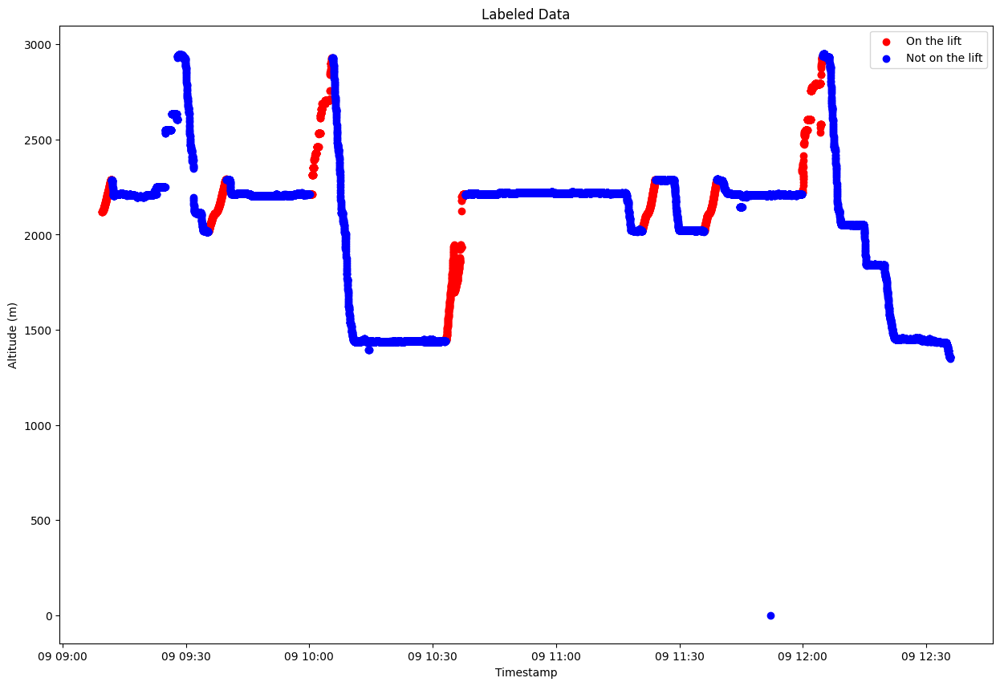

In [138]:
plot_manual_labeling(df_206_reduce_sampling_rate)

In [139]:
# # Call the function with your DataFrame
mymap = map_lift_rides(df_206_reduce_sampling_rate)
mymap

# Export

In [140]:
# export to CSV
name_of_csv='df_206_relabeled.csv'
df_206_reduce_sampling_rate.to_csv(name_of_csv, index=False)